# Computer Vision

In [15]:
!pip install -U scikit-image


####**Implement the Harris algorithm using OpenCV**

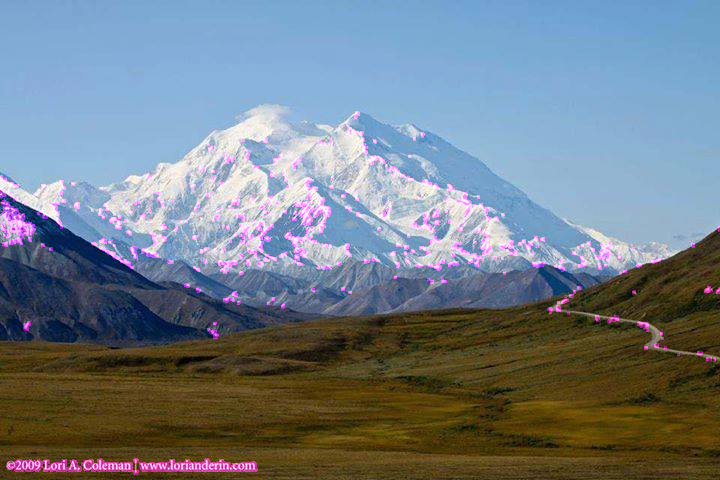

In [16]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load an image
image = cv2.imread('/testimgec.jpeg')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

dst = cv2.cornerHarris(gray, blockSize=2, ksize=5, k=0.01)

dst = cv2.dilate(dst, None)

threshold = 0.01 * dst.max()

mask = np.zeros_like(image)

mask[dst > threshold] = [240,0,240]

result = cv2.addWeighted(image, 1, mask, 0.5, 0)

cv2_imshow(result)


### **Implement Image Pyramid using OpenCV**

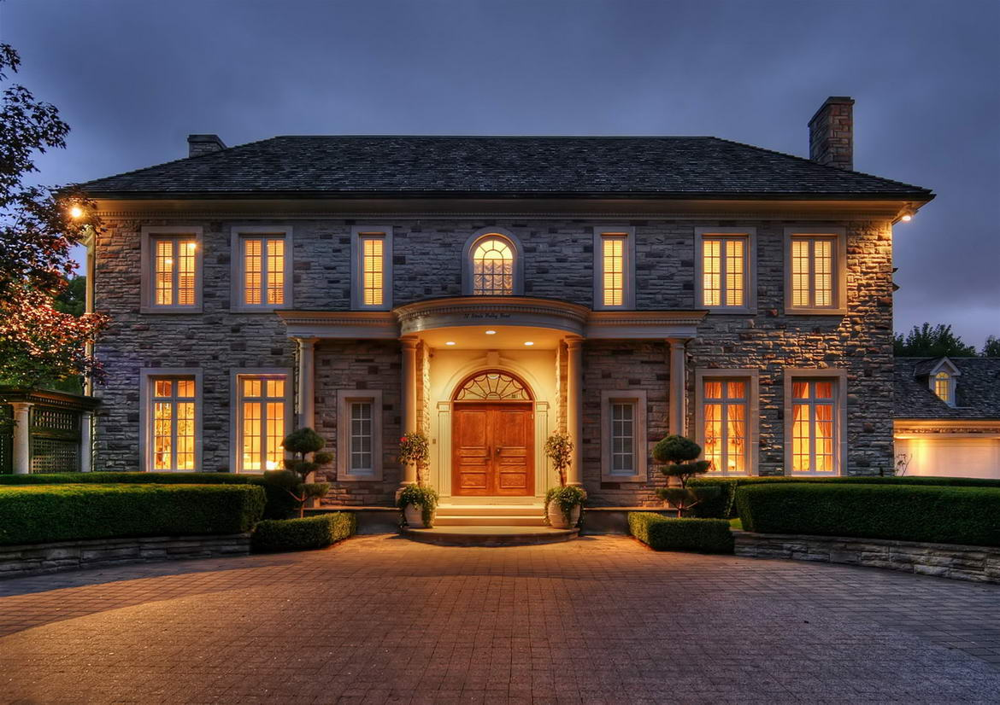

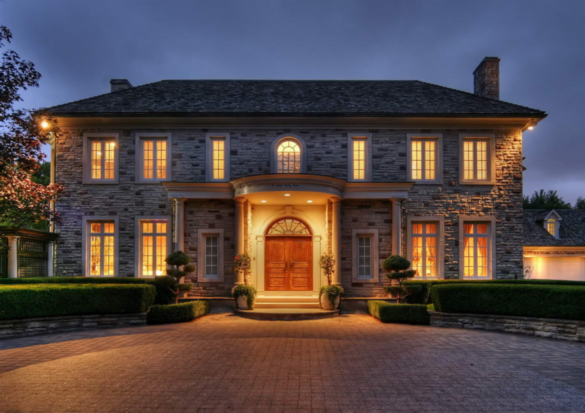

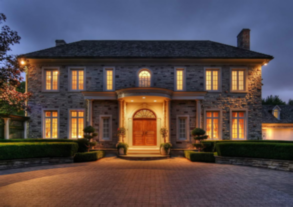

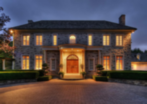

In [17]:
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread('/testimage1.jpeg')

pyramid = [image]

for i in range(3):
    image = cv2.pyrDown(image)
    pyramid.append(image)

for i, level in enumerate(pyramid):
    cv2_imshow(level)
    cv2.waitKey(0)

cv2.destroyAllWindows()

### **Implement Image Segmentation with Watershed Algorithm using OpenCV**

In [18]:
pip install watershed

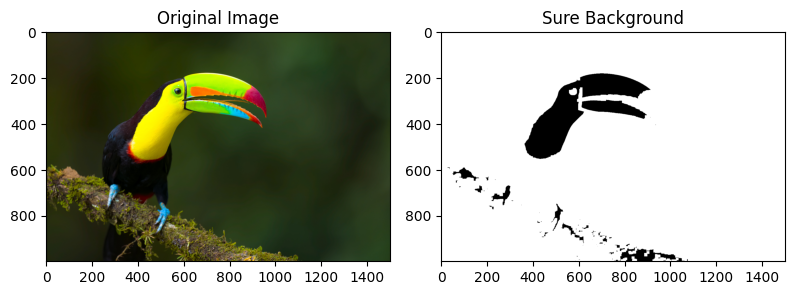

The segmented imaged


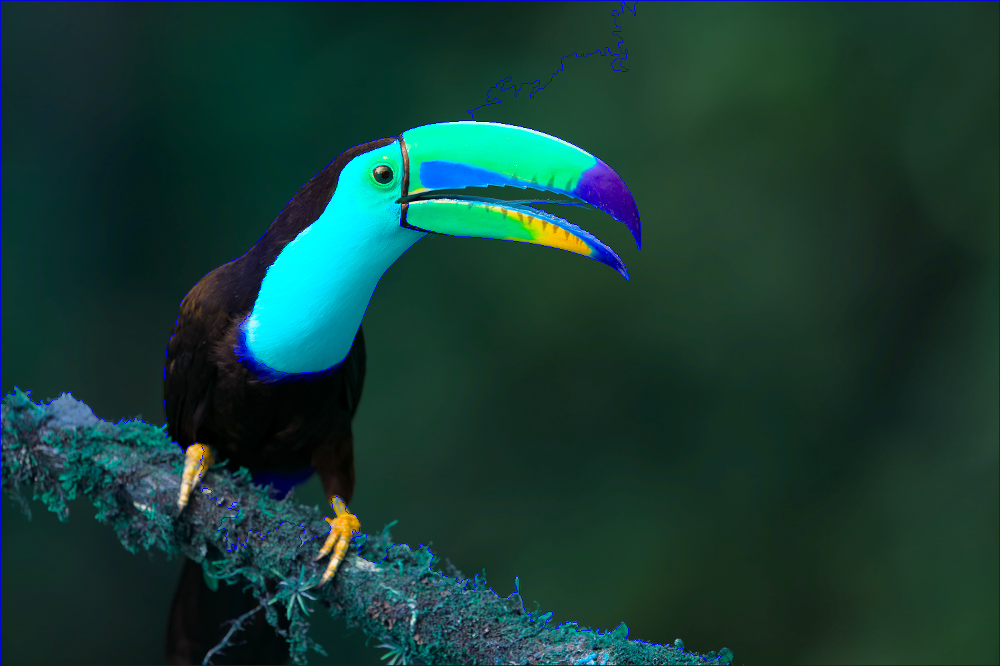

In [19]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

# Load an image
image = cv2.imread('/testimage5.jpeg')
original_image = image.copy()

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding or any preprocessing as needed
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Perform morphological operations to clean the image
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Perform distance transform
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# Find unknown region
sure_fg = np.uint8(sure_fg)
sure_bg = cv2.dilate(opening, kernel, iterations=3)
unknown = cv2.subtract(sure_bg, sure_fg)

# Label markers and apply Watershed
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0
cv2.watershed(image, markers)

# Mark segmented regions in the original image
image[markers == -1] = [0, 0, 255]  # Color the boundaries in red

# Display the results in subplots
plt.figure(figsize=(12, 6))

plt.subplot(131), plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
plt.subplot(132), plt.imshow(sure_bg, cmap='gray'), plt.title('Sure Background')
plt.tight_layout()
plt.show()
print("The segmented imaged")
cv2_imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

### **Implement SIFT algorithm using OpenCV**

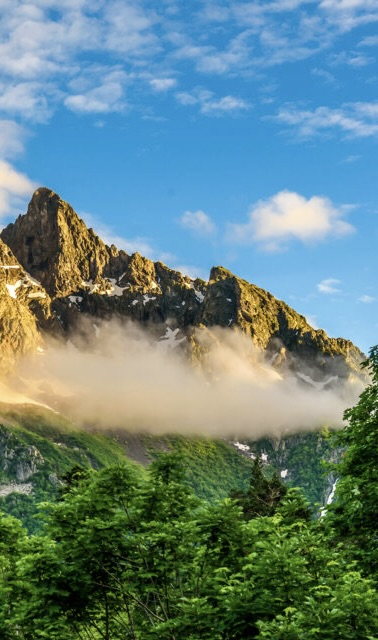

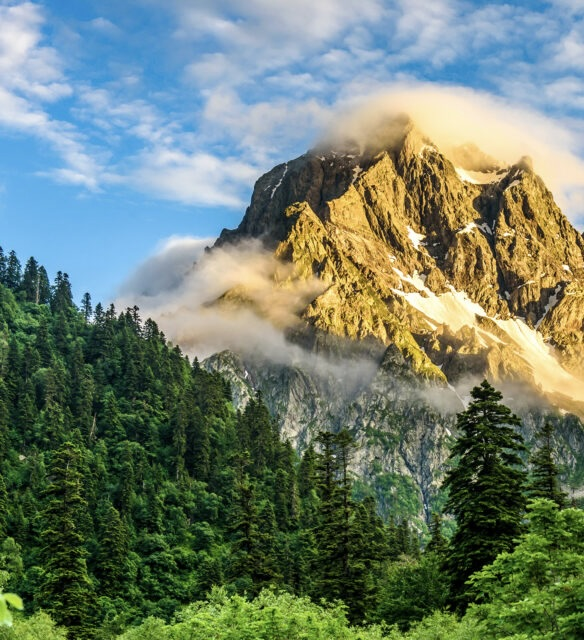

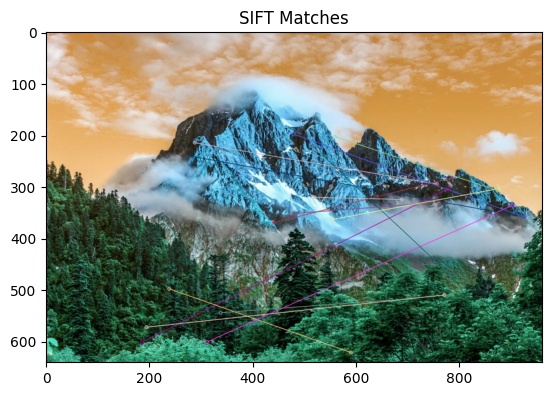

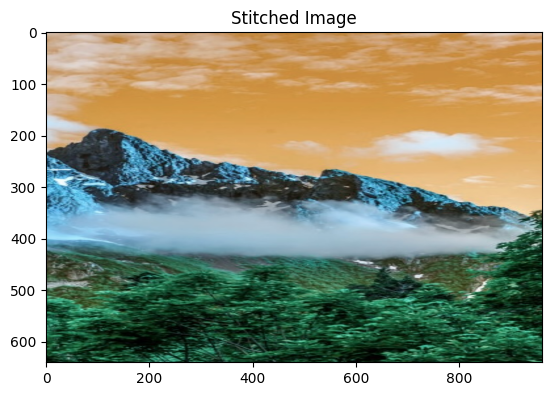

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img2 = cv2.imread('/testimage6 2.jpeg')
img1 = cv2.imread('/testimage6 3.jpeg')
cv2_imshow(img2)
cv2_imshow(img1)
# Convert images to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Create SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# BFMatcher with default parameters
bf = cv2.BFMatcher()

# Match descriptors
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_matches)
plt.title('SIFT Matches')
plt.show()

## After SIFT matching and drawing matches

# Homography estimation
if len(good_matches) >= 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
else:
    raise AssertionError('Can’t find enough keypoints.')

# Warp images
warped_img1 = cv2.warpPerspective(img1, H, (img2.shape[1] + img1.shape[1], img2.shape[0]))

# Resize the images to match dimensions
img2_resized = cv2.resize(img2, (warped_img1.shape[1], warped_img1.shape[0]))

# Blend images
alpha = 0.0
beta = 1.0 - alpha
blended_img = cv2.addWeighted(warped_img1, alpha, img2_resized, beta, 0)

# Display the result
plt.imshow(blended_img)
plt.title('Stitched Image')
plt.show()


### **Implement object detection using YOLO on the COCO dataset. Provide theresults for any 5 images (for testing purposes) from the dataset.**

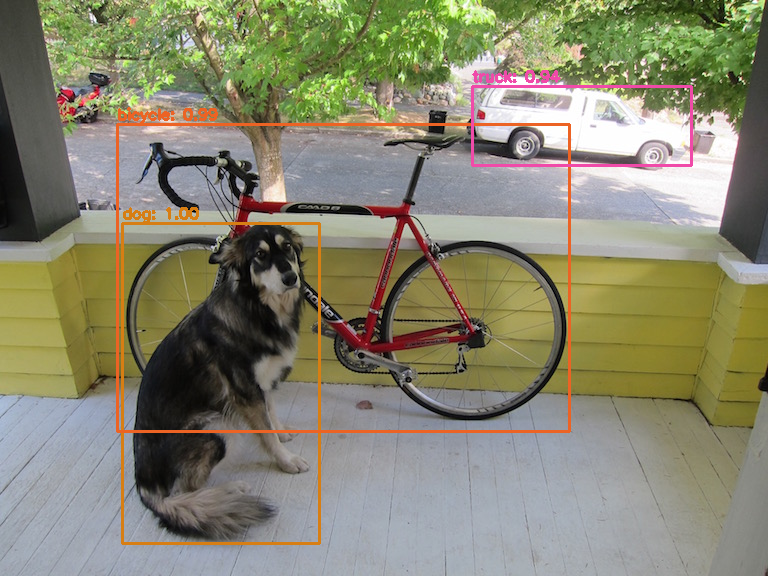

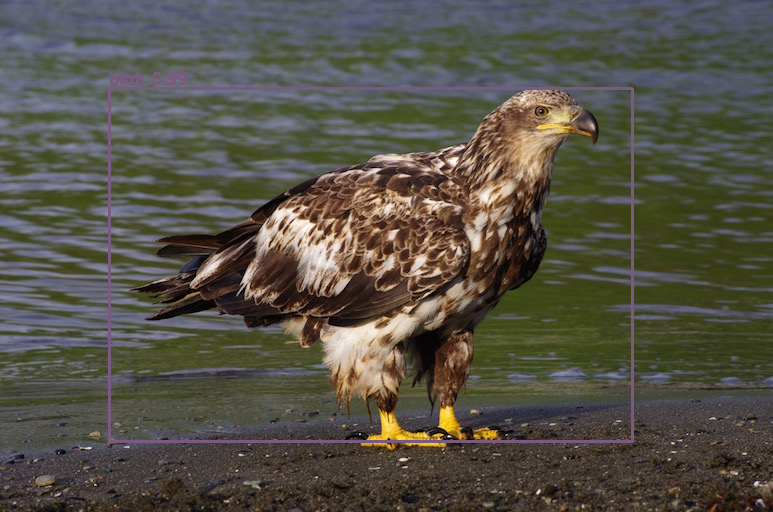

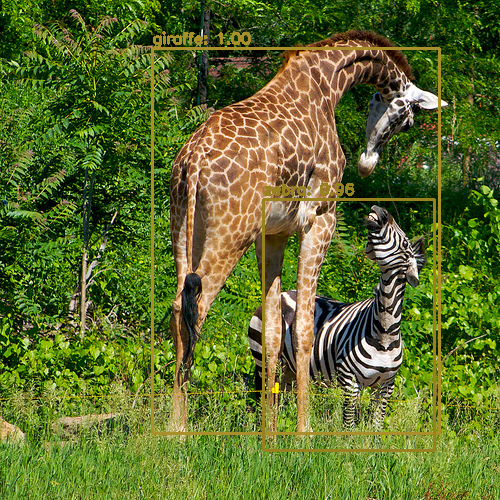

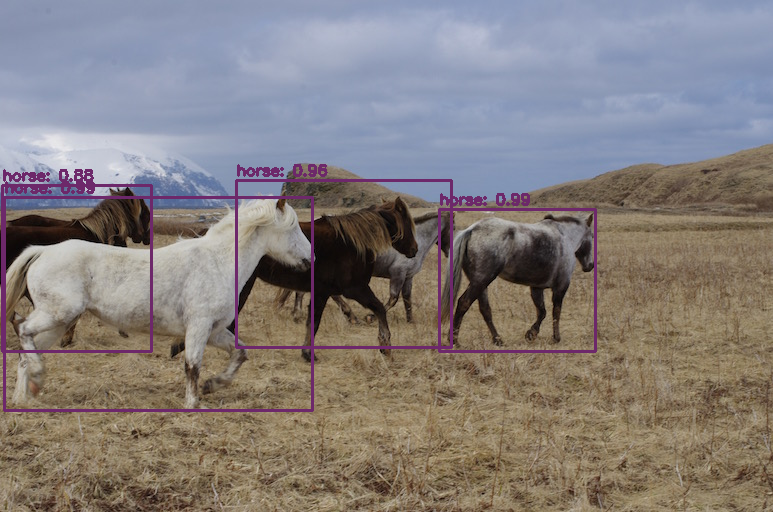

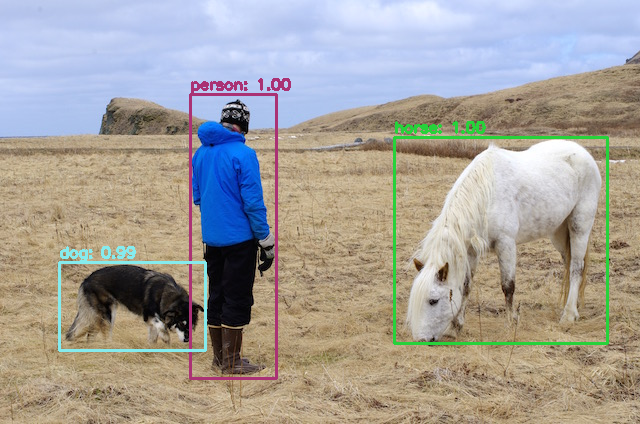

In [21]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load YOLO
net = cv2.dnn.readNet("/yolov3.weights", "/yolov3.cfg")
classes = []
with open("/coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

layer_names = net.getUnconnectedOutLayersNames()

# Load images for testing
image_paths = [
    "/dog.jpg",
    "/eagle.jpg",
    "/giraffe.jpg",
    "/horses.jpg",
    "/person.jpg"
]

for image_path in image_paths:
    # Read the image
    img = cv2.imread(image_path)
    height, width, _ = img.shape

    # Prepare the image for YOLO
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(layer_names)

    # Process the YOLO output
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:

      for detection in out:

        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        if confidence > 0.5:
          center_x = int(detection[0] * width)
          center_y = int(detection[1] * height)

            # Ensure width and height are finite before converting to integers
          w = int(detection[2] * width) if np.isfinite(detection[2] * width) else 0
          h = int(detection[3] * height) if np.isfinite(detection[3] * height) else 0

            # Calculate the top-left corner of the bounding box
          x = int(center_x - w / 2)
          y = int(center_y - h / 2)

          boxes.append([x, y, w, h])
          confidences.append(float(confidence))
          class_ids.append(class_id)

    # Apply non-maximum suppression to avoid overlapping boxes
    indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    # Draw bounding boxes on the image
    colors = np.random.uniform(0, 255, size=(len(classes), 3))
    for i in indices:
        # i = i[0]
        box = boxes[i]
        class_id = class_ids[i]
        confidence = confidences[i]

        # Draw the bounding box and label on the image
        color = colors[class_id]
        cv2.rectangle(img, (box[0], box[1]), (box[0] + box[2], box[1] + box[3]), color, 2)
        label = f"{classes[class_id]}: {confidence:.2f}"
        cv2.putText(img, label, (box[0], box[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Show the image with bounding boxes
    cv2_imshow(img)
    cv2.waitKey(0)

cv2.destroyAllWindows()


